In [82]:
import pandas as pd
import warnings
import pymysql
from sqlalchemy.orm import sessionmaker
from sqlalchemy import create_engine
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
import matplotlib.font_manager as fm
import random
from matplotlib import font_manager, rc
warnings.filterwarnings("ignore", category=FutureWarning)


# 한글 폰트 설정
font_path = 'C:\Windows\Fonts\malgun.ttf'
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)

plt.style.use ('ggplot')
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['font.size'] = 7.5
plt.rcParams['axes.unicode_minus'] = False
# pd.set_option('display.max_columns', 100)
# pd.set_option('display.max_rows', 100)

In [83]:
cnx = pymysql.connect(
    user="multi",
    password="Campus123!",
    host="ec2-15-152-211-160.ap-northeast-3.compute.amazonaws.com",
    database="Data_Mart",
)

query = "SELECT * FROM credit_analysis_model_a;"
model_a = pd.read_sql(query, cnx) 

query = "SELECT * FROM credit_analysis_model_b;"
model_b = pd.read_sql(query, cnx) 

cnx.close()

c:\Users\USER_20211027\anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


c:\Users\USER_20211027\anaconda3\lib\site-packages\pandas\io\sql.py:761: UserWarning: pandas only support SQLAlchemy connectable(engine/connection) ordatabase string URI or sqlite3 DBAPI2 connectionother DBAPI2 objects are not tested, please consider using SQLAlchemy
  warnings.warn(


### 극단값/이상치 제거: model.describe() 봐서 판단하면서 제거
1. 컬럼별 극단값 0.001% 제거할 예정 (상위 3개 하위 3개) - 하지만 제거 안해도 될 값은 안 하는 게 좋음 
2. 비율 볼 때 극단치 제거가 목표!! 예: ebitda_margin == -12526.985 
3. 일반 계정은 제거 안 하는 게 좋음. 예: 매출액 / 매출원가 / EBITDA 등등 -> 제거하면 삼성전자 / SK / 현대자동차 같은 대기업 당연하게 제거됨 
   - 비율만 제거! 
4. 경제 지표 / 기업 리뷰 데이터 제거 안 함 
5. 하위 값 0.001% 음수인 경우만 제거 - 양수면 제거 안 함 (0에 제일 가까운 값 제거 할 필요 X)

In [84]:
model_a.describe()

,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,ebit_margin,...,rating,paywellfare,worklifebal,culture,opportunity,manager,recommend,ceo,potential,crb_index_avg
count,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3.097000e+03,3.097000e+03,3.097000e+03,3.097000e+03,3097.000000,...,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000
mean,-2.882557,40.948553,0.478166,0.308153,1.410622,3.603240e+12,2.803462e+12,4.231992e+11,2.152122e+11,-3.005391,...,2.825131,2.784634,3.006500,2.594659,2.679684,2.239396,1.290491,1.316422,1.187091,214.687310
std,227.773388,760.817358,0.204890,14.923190,165.902521,1.427841e+13,1.056336e+13,2.586860e+12,2.128457e+12,227.742018,...,0.503111,0.619845,0.592226,0.479991,0.402268,0.422921,0.690566,0.667644,0.691573,50.326558
min,-12526.985234,-1312.671136,0.014647,-532.783154,-5367.015660,1.747813e+08,0.000000e+00,5.417029e+06,-3.384362e+13,-12526.985234,...,0.060000,0.030000,0.030000,0.090000,0.090000,0.060000,0.060000,0.060000,0.060000,157.422309
25%,0.188978,-0.050986,0.321539,0.046023,-1.448183,2.266950e+11,1.456726e+11,2.155040e+10,6.506744e+08,0.188277,...,2.500000,2.350000,2.640000,2.260000,2.440000,1.970000,0.750000,0.810000,0.660000,187.793544
50%,3.723956,2.227229,0.487419,0.221925,0.113407,6.383948e+11,4.672618e+11,6.057857e+10,2.063504e+10,3.721099,...,2.820000,2.760000,3.000000,2.560000,2.690000,2.220000,1.260000,1.290000,1.140000,198.613552
75%,8.079782,8.040380,0.626568,0.516883,3.066752,1.912956e+12,1.373570e+12,1.852827e+11,9.070067e+10,8.031722,...,3.140000,3.200000,3.400000,2.900000,2.930000,2.460000,1.740000,1.760000,1.600000,222.124992
max,428.093799,37330.000000,1.444099,235.338460,5073.347387,3.022314e+14,1.900418e+14,6.881296e+13,6.115996e+13,428.093799,...,5.000000,5.000000,5.000000,4.290000,4.130000,4.140000,4.070000,4.070000,4.070000,304.641558


In [85]:
model_b.describe()

,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,ebit_margin,...,enterprise_value_to_ebitda,operating_income,net_income,fixed_assets,total_asset_turnover,net_working_capital_turnover,fixed_asset_turnover,accounts_receivable_turnover,inventory_turnover,accounts_payable_turnover
count,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3.097000e+03,3.097000e+03,3.097000e+03,3.097000e+03,3097.000000,...,3097.000000,3.097000e+03,3.097000e+03,3.097000e+03,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000,3097.000000
mean,-2.882557,40.948553,0.478166,0.308153,1.410622,3.603240e+12,2.803462e+12,4.231992e+11,2.152122e+11,-3.005391,...,129.489940,3.772247e+11,1.715484e+11,2.066831e+12,0.882062,2.973002,4.426012,22.297524,172.318454,95.544966
std,227.773388,760.817358,0.204890,14.923190,165.902521,1.427841e+13,1.056336e+13,2.586860e+12,2.128457e+12,227.742018,...,6070.153504,2.436230e+12,1.780095e+12,1.034429e+13,0.505884,194.747027,9.978154,379.937120,2892.795252,2266.199734
min,-12526.985234,-1312.671136,0.014647,-532.783154,-5367.015660,1.747813e+08,0.000000e+00,5.417029e+06,-3.384362e+13,-12526.985234,...,-23056.691534,-3.265515e+13,-2.442911e+13,3.336264e+07,0.011501,-7454.681471,0.016514,0.000000,0.000000,0.000000
25%,0.188978,-0.050986,0.321539,0.046023,-1.448183,2.266950e+11,1.456726e+11,2.155040e+10,6.506744e+08,0.188277,...,0.018593,4.477122e+09,-7.064524e+08,8.530476e+10,0.554351,-1.738836,1.493292,4.830736,3.298921,4.959986
50%,3.723956,2.227229,0.487419,0.221925,0.113407,6.383948e+11,4.672618e+11,6.057857e+10,2.063504e+10,3.721099,...,7.182502,2.819982e+10,1.538463e+10,2.653813e+11,0.799479,2.870292,2.349091,6.540571,5.683296,7.355954
75%,8.079782,8.040380,0.626568,0.516883,3.066752,1.912956e+12,1.373570e+12,1.852827e+11,9.070067e+10,8.031722,...,17.227713,1.216791e+11,6.945519e+10,8.332724e+11,1.100877,6.977693,3.965537,9.099626,10.217243,10.882731
max,428.093799,37330.000000,1.444099,235.338460,5073.347387,3.022314e+14,1.900418e+14,6.881296e+13,6.115996e+13,428.093799,...,329567.545659,5.888667e+13,5.565408e+13,1.882631e+14,4.292599,3697.073914,259.780897,18135.464558,84333.139443,82615.462270


In [86]:
model_a_filter = ['ebitda_margin', 'ebitda_to_interest_expense', 'debt_ratio', 'dependence_on_net_borrowings', 'net_borrowings_to_ebitda', 'ebit_margin', 'ebitda_to_sales_revenue',
                  'borrowing_dependency', 'total_borrowings_to_ebitda', 'debt_to_net_income_ratio', 'total_assets_leverage', 'current_liabilities_ratio',
                  'quick_ratio', 'days_sales_outstanding', 'average_accounts_receivable_per_sales_turnover']

investment_data_filter = ['return_on_equity', 'return_on_invested_capital', 'current_ratio', 'non_current_debt_ratio', 'equity_ratio', 'interest_coverage_ratio',
                  'debt_to_equity_ratio', 'retention_ratio', 'earnings_per_share', 'book_value_per_share', 'price_earnings_ratio', 'price_to_book_ratio',
                  'price_cash_flow_ratio', 'enterprise_value_to_ebitda', 'net_working_capital_turnover', 'fixed_asset_turnover', 'accounts_receivable_turnover',
                  'inventory_turnover', 'accounts_payable_turnover']

model_b_filter = model_a_filter + investment_data_filter

In [87]:
def process_model(model, model_filter, model_name):
    model_processed = model.copy()

    indices_to_drop = set()
    causes = {}

    for col in model_filter:
        sorted_col = model_processed[col].sort_values()

        top3_indices = sorted_col[-3:].index.tolist()
        bottom3_indices = sorted_col[:3].index.tolist() if sorted_col[:3].min() < 0 else []

        for idx in top3_indices + bottom3_indices:
            indices_to_drop.add(idx)
            corp_name = model_processed.loc[idx, 'corp']  # Get the 'corp' name
            if corp_name not in causes:
                causes[corp_name] = []
            causes[corp_name].append(col)


    model_processed = model_processed.drop(indices_to_drop)

    model_processed.reset_index(drop=True, inplace=True)

    model_with_y = model_processed[model_processed['rank'].notna()].reset_index(drop=True)
    model_without_y = model_processed[model_processed['rank'].isna()].reset_index(drop=True)

    print(f"{model_name} original shape: {model.shape}")
    print(f"{model_name} processed shape: {model_processed.shape}")
    print(f"{model_name} with y shape: {model_with_y.shape}")
    print(f"{model_name} without y shape: {model_without_y.shape}")
    print()
    
    return model_processed, model_with_y, model_without_y, causes

model_a_processed, model_a_with_y, model_a_without_y, causes_a = process_model(model_a, model_a_filter, 'model_a')
model_b_processed, model_b_with_y, model_b_without_y, causes_b = process_model(model_b, model_b_filter, 'model_b')

causes_a = str(causes_a).replace('\n', '').replace('  ', ' ')
causes_b = str(causes_b).replace('\n', '').replace('  ', ' ')


model_a original shape: (3097, 57)
model_a processed shape: (3055, 57)
model_a with y shape: (827, 57)
model_a without y shape: (2228, 57)

model_b original shape: (3097, 84)
model_b processed shape: (3009, 84)
model_b with y shape: (815, 84)
model_b without y shape: (2194, 84)



### 극단값/이상치로 인해 지워진 Row 데이터 확인

In [88]:
causes_a

"{'더메디팜': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue'], '한진칼': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'days_sales_outstanding', 'average_accounts_receivable_per_sales_turnover'], '미래아이앤지': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'quick_ratio'], '에스케이바이오팜': ['ebitda_margin', 'ebitda_margin', 'ebitda_to_interest_expense', 'ebit_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'ebitda_to_sales_revenue'], '롯데관광개발': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'current_liabilities_ratio'], '현대퓨처넷': ['ebitda_to_interest_expense', 'ebitda_to_interest_expense'], 'LX홀딩스': ['ebitda_to_interest_expense'], '세우글로벌': ['ebitda_to_interest_expense'], 'HDC랩스': ['ebitda_to_interest_expense'], '아센디오': ['debt_ratio'], 'HJ중공업': ['debt_ratio'], '한컴라이프케어': ['debt_ratio'], 'LG헬로비전': ['dependence_on_net_borrowings', 'dependence_on_net_borrowings', 'borrowing_dependency', 'borrowing_dependency', 'total_assets_leverage', 'total_assets_lever

In [89]:
causes_b

"{'더메디팜': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue'], '한진칼': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'days_sales_outstanding', 'average_accounts_receivable_per_sales_turnover'], '미래아이앤지': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'quick_ratio'], '에스케이바이오팜': ['ebitda_margin', 'ebitda_margin', 'ebitda_to_interest_expense', 'ebit_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'ebitda_to_sales_revenue', 'return_on_invested_capital', 'return_on_invested_capital', 'interest_coverage_ratio', 'earnings_per_share', 'earnings_per_share', 'book_value_per_share'], '롯데관광개발': ['ebitda_margin', 'ebit_margin', 'ebitda_to_sales_revenue', 'current_liabilities_ratio'], '현대퓨처넷': ['ebitda_to_interest_expense', 'ebitda_to_interest_expense', 'interest_coverage_ratio', 'interest_coverage_ratio'], 'LX홀딩스': ['ebitda_to_interest_expense', 'equity_ratio', 'equity_ratio', 'interest_coverage_ratio'], '세우글로벌': ['ebitda_to_interest_expense', 'interest_coverag

### 이상치 처리 후 model.describe()로 비율 봤을 때 비교적 많이 좋아짐 

In [90]:
model_a_processed.describe()

,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,ebit_margin,...,rating,paywellfare,worklifebal,culture,opportunity,manager,recommend,ceo,potential,crb_index_avg
count,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3.055000e+03,3.055000e+03,3.055000e+03,3.055000e+03,3055.000000,...,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000,3055.000000
mean,1.594179,22.356657,0.476859,0.449167,2.208888,3.618171e+12,2.810236e+12,4.261031e+11,2.185526e+11,1.470508,...,2.827457,2.786498,3.009133,2.595931,2.680831,2.240930,1.292455,1.318282,1.189103,214.849796
std,25.987586,208.123931,0.201857,2.080300,33.330702,1.430367e+13,1.055059e+13,2.602619e+12,2.142795e+12,25.730093,...,0.503908,0.619732,0.593460,0.481451,0.403234,0.424037,0.690695,0.667804,0.691375,50.348914
min,-462.753943,-164.841190,0.014647,-3.583935,-351.630650,1.747813e+08,0.000000e+00,5.417029e+06,-3.384362e+13,-462.753943,...,0.060000,0.030000,0.030000,0.090000,0.090000,0.060000,0.060000,0.060000,0.060000,157.422309
25%,0.291772,0.004225,0.321501,0.047300,-1.436967,2.326491e+11,1.486385e+11,2.193623e+10,1.095569e+09,0.289243,...,2.500000,2.360000,2.640000,2.260000,2.440000,1.970000,0.760000,0.815000,0.660000,187.793544
50%,3.748585,2.277636,0.486289,0.222276,0.114441,6.454121e+11,4.713924e+11,6.085410e+10,2.085844e+10,3.744591,...,2.820000,2.760000,3.000000,2.560000,2.690000,2.220000,1.260000,1.290000,1.140000,198.613552
75%,8.081637,8.123143,0.625133,0.511260,3.046072,1.946526e+12,1.377858e+12,1.865608e+11,9.314134e+10,8.033676,...,3.150000,3.210000,3.400000,2.900000,2.930000,2.470000,1.740000,1.760000,1.610000,222.124992
max,174.936508,8905.052632,1.127188,106.792347,822.226682,3.022314e+14,1.900418e+14,6.881296e+13,6.115996e+13,134.869918,...,5.000000,5.000000,5.000000,4.290000,4.130000,4.140000,4.070000,4.070000,4.070000,304.641558


In [91]:
model_b_processed.describe()

,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,ebit_margin,...,enterprise_value_to_ebitda,operating_income,net_income,fixed_assets,total_asset_turnover,net_working_capital_turnover,fixed_asset_turnover,accounts_receivable_turnover,inventory_turnover,accounts_payable_turnover
count,3009.000000,3009.000000,3009.000000,3009.000000,3009.000000,3.009000e+03,3.009000e+03,3.009000e+03,3.009000e+03,3009.000000,...,3009.000000,3.009000e+03,3.009000e+03,3.009000e+03,3009.000000,3009.000000,3009.000000,3009.000000,3009.000000,3009.000000
mean,1.739089,19.485898,0.475152,0.443615,2.205938,3.647568e+12,2.832195e+12,4.296418e+11,2.205529e+11,1.614377,...,14.688468,3.835042e+11,1.765967e+11,2.094901e+12,0.883267,3.783297,4.220118,11.638691,87.775684,27.930581
std,25.340286,132.937711,0.200250,2.090117,33.440247,1.439978e+13,1.062022e+13,2.620781e+12,2.158739e+12,25.074958,...,356.477965,2.470312e+12,1.805253e+12,1.044978e+13,0.495008,69.603774,8.002886,64.130474,1472.534807,521.299587
min,-462.753943,-164.841190,0.031830,-3.583935,-351.630650,1.929475e+08,0.000000e+00,5.417029e+06,-3.384362e+13,-462.753943,...,-5874.895590,-3.265515e+13,-2.442911e+13,6.520309e+07,0.039299,-1449.266209,0.073000,0.000000,0.000000,0.000000
25%,0.345948,0.024294,0.320464,0.046746,-1.431996,2.349812e+11,1.518314e+11,2.219862e+10,1.282848e+09,0.345148,...,0.459175,4.808520e+09,-3.073758e+07,8.747641e+10,0.557309,-1.646666,1.503021,4.839078,3.300526,4.973421
50%,3.770530,2.304063,0.485584,0.220527,0.114950,6.474521e+11,4.742369e+11,6.123236e+10,2.111561e+10,3.761405,...,7.257646,2.846257e+10,1.602296e+10,2.696524e+11,0.801706,2.947833,2.346048,6.537098,5.672078,7.355954
75%,8.087695,8.154784,0.623709,0.506823,3.041071,1.965612e+12,1.378565e+12,1.890737e+11,9.379003e+10,8.042888,...,17.121148,1.224195e+11,7.106895e+10,8.571154e+11,1.101672,7.075280,3.948719,9.050187,10.059425,10.862774
max,174.936508,2993.364204,1.091653,106.792347,822.226682,3.022314e+14,1.900418e+14,6.881296e+13,6.115996e+13,134.869918,...,12259.701133,5.888667e+13,5.565408e+13,1.882631e+14,3.895848,1075.205797,120.491046,2291.905320,64117.417956,19863.684085


## 테이블 전처리

In [92]:
model_b_processed['rank'].isnull().sum()

2194

### rank의 널값이 많은 상황, 케이스에 따라 세가지 테이블 생성

In [93]:
# rank의 널값이 많은 상황, 케이스에 따라 세가지 테이블 생성

raw_data = model_b_processed.copy()
data_without_rank = raw_data.drop(['rank'], axis = 1)
data_with_rank = raw_data.copy().dropna()

In [94]:
print(raw_data.shape)
print(data_without_rank.shape)
print(data_with_rank.shape)

(3009, 84)
(3009, 83)
(815, 84)


## 전체 데이터 셋 eda
- data_without_rank 사용
- data_without_rank 는 eda를 위해 널값이 많은 rank 칼럼만 드랍했다.
- 사실상 전체 데이터셋으로 봐도 무방하다.

---

In [95]:
print(data_without_rank.info())
print(data_without_rank.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3009 entries, 0 to 3008
Data columns (total 83 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   corp                                            3009 non-null   object 
 1   stock_code                                      3009 non-null   object 
 2   sector                                          3009 non-null   object 
 3   year                                            3009 non-null   object 
 4   ebitda_margin                                   3009 non-null   float64
 5   ebitda_to_interest_expense                      3009 non-null   float64
 6   debt_ratio                                      3009 non-null   float64
 7   dependence_on_net_borrowings                    3009 non-null   float64
 8   net_borrowings_to_ebitda                        3009 non-null   float64
 9   revenue                                  

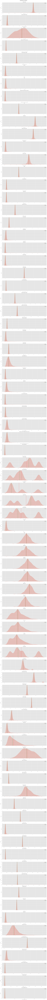

In [96]:
# 칼럼별 데이터 분포 확인
columns_to_plot = data_without_rank.columns[4:]

num_rows = len(columns_to_plot)

fig, axes = plt.subplots(nrows=num_rows, figsize=(15, 4*num_rows))
fig.suptitle('Distribution by feature', y=1, fontsize=16)

for i, column in enumerate(columns_to_plot):
    sns.kdeplot(data_without_rank[column], fill=True, ax=axes[i])

    mean_value = data_without_rank[column].mean()
    median_value = data_without_rank[column].median()

    axes[i].axvline(mean_value, color='r', linestyle='--', label='Mean')
    axes[i].axvline(median_value, color='g', linestyle='--', label='Median')

    axes[i].set_title(column)

    axes[i].legend()

plt.tight_layout()

plt.show()

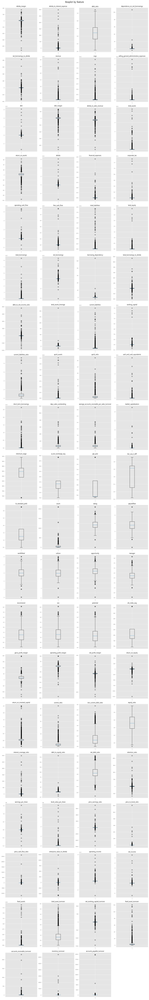

In [97]:
# 칼럼별 박스 플랏 확인
num_columns = 4
num_rows = (len(data_without_rank.columns) - 4) // num_columns + 1

fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 5*num_rows))

axes = axes.flatten()

for i, column in enumerate(data_without_rank.columns[4:]):
    axes[i].boxplot(data_without_rank[column])
    axes[i].set_title(column)
    
fig.suptitle('Boxplot by feature', y=1, fontsize=16)

for j in range(len(data_without_rank.columns[4:]), num_rows * num_columns):
    fig.delaxes(axes[j])


plt.tight_layout()
plt.show()

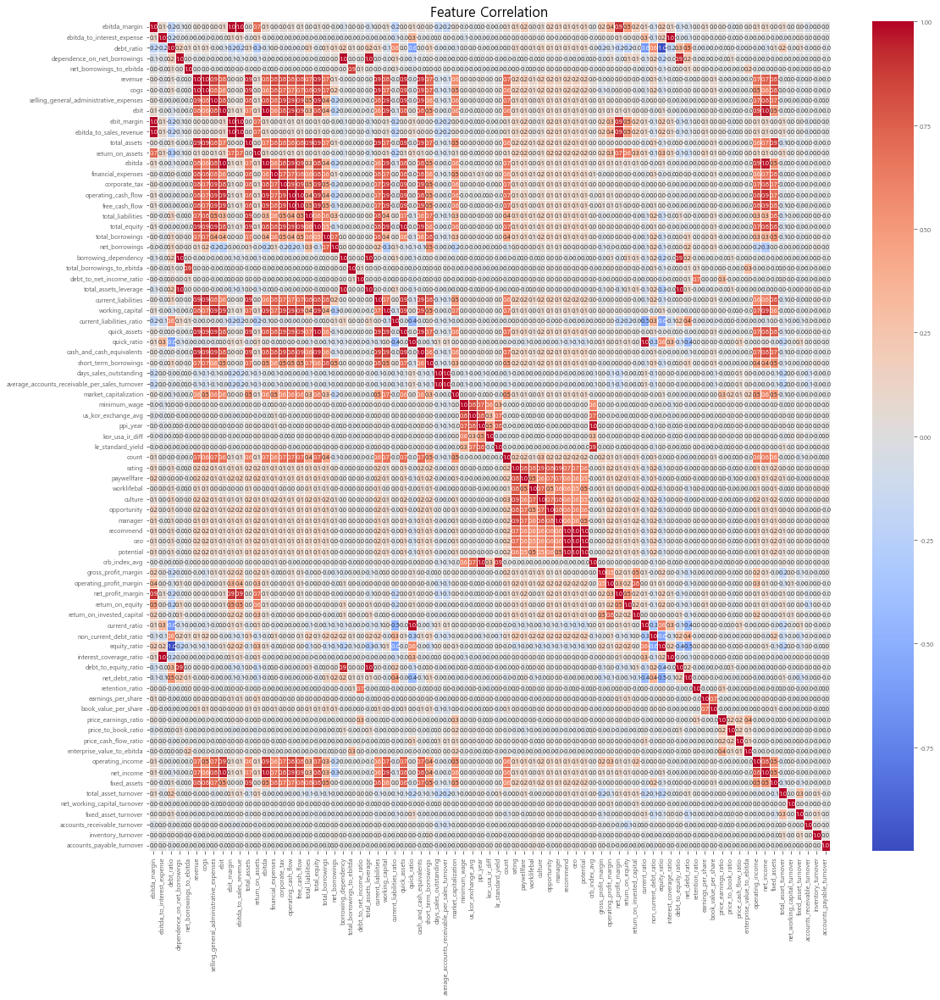

In [98]:
# 상관관계 확인
columns_to_correlate = data_without_rank.columns[4:]
subset_df = data_without_rank[columns_to_correlate]

f, ax = plt.subplots(figsize=(18, 18))
heatmap = sns.heatmap(subset_df.corr(), annot=True, linewidths=.5, fmt='.1f', ax=ax, cmap='coolwarm')
heatmap.set_title('Feature Correlation', fontsize=16)
plt.show()

## 시가총액에 큰 영향을 미치는 변수들은 무엇일까?

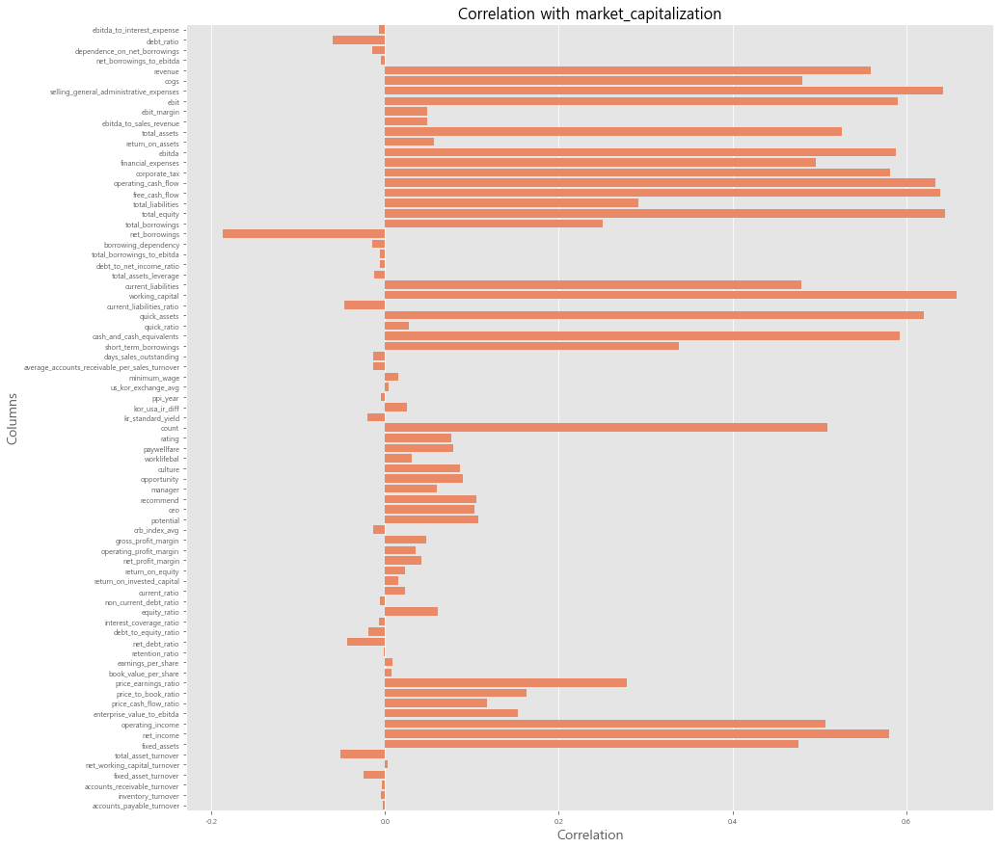

In [99]:
# market_capitalization 칼럼과 다른 칼럼들 간의 상관계수 계산
market_capitalization_correlation = data_without_rank.iloc[:, 5:].corrwith(data_without_rank['market_capitalization']).drop('market_capitalization')

# 상관계수를 시각화하여 가장 영향을 많이 주는 칼럼 파악
plt.figure(figsize=(15, 15))
sns.barplot(x=market_capitalization_correlation.values, y=market_capitalization_correlation.index, orient='h', color='Coral')
plt.title('Correlation with market_capitalization', fontsize=16)
plt.xlabel('Correlation', fontsize=14)
plt.ylabel('Columns', fontsize=14)
plt.show()

In [100]:
# 상관관계가 높은 상위 5개의 칼럼 추출
top_5_columns = market_capitalization_correlation.nlargest(5)
bot_5_columns = market_capitalization_correlation.nsmallest(5)

# 결과 출력
print("시가총액에 긍정적인 영향을 미치는 Top 5:")
for column, correlation in top_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")
    
print('')
print("시가총액에 부정적인 영향을 미치는 Top 5:")
for column, correlation in bot_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")

시가총액에 긍정적인 영향을 미치는 Top 5:
working_capital 0.66
total_equity 0.64
selling_general_administrative_expenses 0.64
free_cash_flow 0.64
operating_cash_flow 0.63

시가총액에 부정적인 영향을 미치는 Top 5:
net_borrowings -0.19
debt_ratio -0.06
total_asset_turnover -0.05
current_liabilities_ratio -0.05
net_debt_ratio -0.04


## 매출액에 큰 영향을 미치는 변수는 무엇일까?

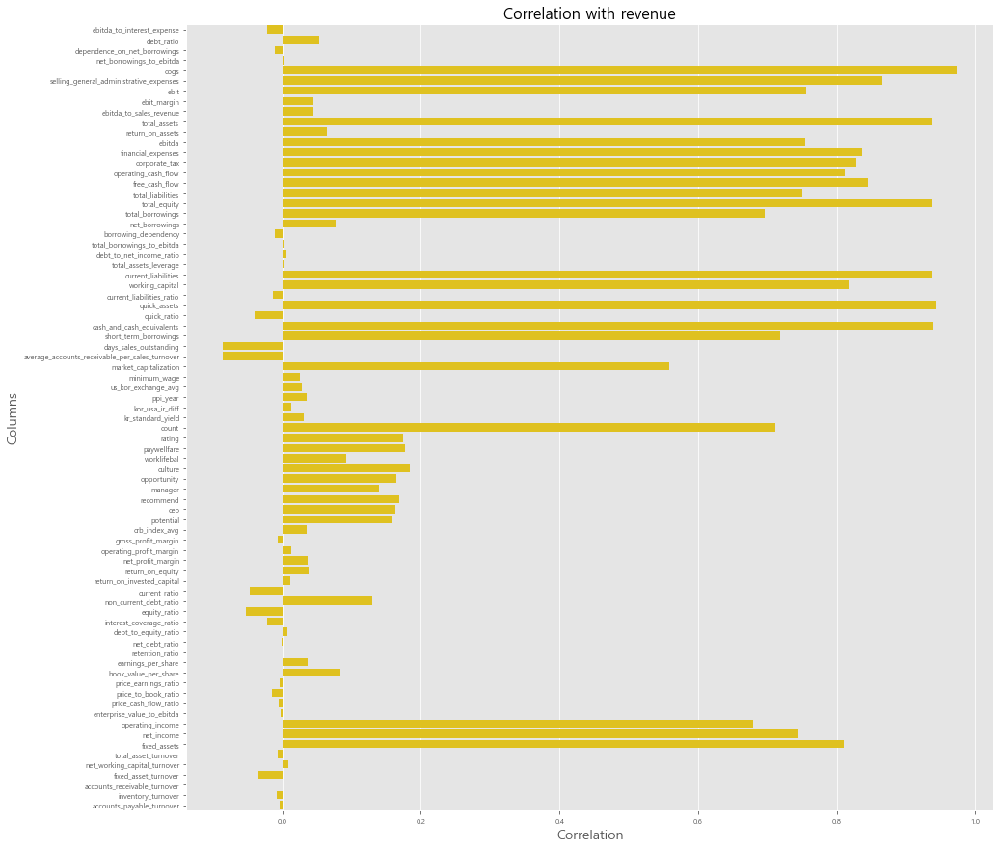

In [101]:
# revenue 칼럼과 다른 칼럼들 간의 상관계수 계산
revenue_correlation = data_without_rank.iloc[:, 5:].corrwith(data_without_rank['revenue']).drop('revenue')

# 상관계수를 시각화하여 가장 영향을 많이 주는 칼럼 파악
plt.figure(figsize=(15, 15))
sns.barplot(x=revenue_correlation.values, y=revenue_correlation.index, orient='h', color='Gold')
plt.title('Correlation with revenue', fontsize=16)
plt.xlabel('Correlation', fontsize=14)
plt.ylabel('Columns', fontsize=14)
plt.show()

In [102]:
# 상관관계가 높은 상위 5개의 칼럼 추출
top_5_columns = revenue_correlation.nlargest(5)
bot_5_columns = revenue_correlation.nsmallest(5)

# 결과 출력
print("매출액에 긍정적인 영향을 미치는 Top 5:")
for column, correlation in top_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")
    
print('')
print("매출액에 부정적인 영향을 미치는 Top 5:")
for column, correlation in bot_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")

매출액에 긍정적인 영향을 미치는 Top 5:
cogs 0.97
quick_assets 0.94
cash_and_cash_equivalents 0.94
total_assets 0.94
current_liabilities 0.94

매출액에 부정적인 영향을 미치는 Top 5:
days_sales_outstanding -0.09
average_accounts_receivable_per_sales_turnover -0.09
equity_ratio -0.05
current_ratio -0.05
quick_ratio -0.04


## data_with_rank
- 신용지표가 존재하는 840개의 기업을 대상으로 EDA

In [103]:
print(data_with_rank.info())
print(data_with_rank.describe())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 815 entries, 1 to 3006
Data columns (total 84 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   corp                                            815 non-null    object 
 1   stock_code                                      815 non-null    object 
 2   sector                                          815 non-null    object 
 3   year                                            815 non-null    object 
 4   ebitda_margin                                   815 non-null    float64
 5   ebitda_to_interest_expense                      815 non-null    float64
 6   debt_ratio                                      815 non-null    float64
 7   dependence_on_net_borrowings                    815 non-null    float64
 8   net_borrowings_to_ebitda                        815 non-null    float64
 9   revenue                                   

rank 값 수치화

In [104]:
data_with_rank['rank'].unique()

array(['BBB', 'AA-', 'AA', 'A', 'A-', 'A+', 'JB', 'AA+', 'AAA'],
      dtype=object)

In [105]:
# rank 열 값 처리
rank_mapping = {
    None: None,
    'JB': 1,
    'BBB':2,
    'A-': 3,
    'A': 4,
    'A+': 5,
    'AA-': 6,
    'AA': 7,
    'AA+': 8,
    'AAA': 9
}
data_with_rank['rank'] = data_with_rank['rank'].map(rank_mapping)

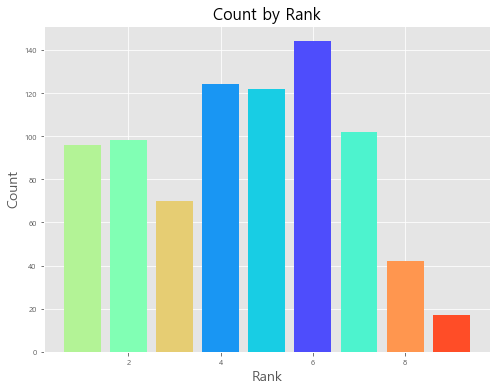

In [106]:
# rank별 카운트 집계
# 'rank' 열별로 개수를 계산
rank_counts = data_with_rank['rank'].value_counts()

# 막대 그래프의 색상을 무지개색으로 지정
colors = sns.color_palette('rainbow', len(rank_counts))

# 바 그래프로 시각화 (색상 변경)
plt.figure(figsize=(8, 6))
plt.bar(rank_counts.index, rank_counts.values, color=colors)
plt.title('Count by Rank', fontsize=16)
plt.xlabel('Rank', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.show()

In [107]:
# 'year'와 'rank'의 빈도수 계산
rank_counts = data_with_rank.groupby(['year', 'rank']).size().reset_index(name='Count')

# 'year'별 'rank'의 총 개수 계산
year_totals = rank_counts.groupby('year')['Count'].sum().reset_index(name='Total')

# 'rank'의 비율 계산
rank_counts = rank_counts.merge(year_totals, on='year')
rank_counts['Ratio'] = rank_counts['Count'] / rank_counts['Total']

# 'year'별 'rank' 비율 분포를 데이터프레임으로 생성
rank_ratio_df = rank_counts.pivot(index='rank', columns='year', values='Ratio')
rank_ratio_df = rank_ratio_df.reindex()

# 표로 출력
print(rank_ratio_df)

year      2018      2019      2020      2021      2022
rank                                                  
1.0   0.077519  0.148387  0.130682  0.124324  0.100000
2.0   0.116279  0.122581  0.119318  0.113514  0.129412
3.0   0.108527  0.083871  0.079545  0.075676  0.088235
4.0   0.155039  0.148387  0.147727  0.162162  0.147059
5.0   0.139535  0.103226  0.159091  0.162162  0.176471
6.0   0.178295  0.167742  0.170455  0.178378  0.188235
7.0   0.139535  0.148387  0.125000  0.113514  0.105882
8.0   0.062016  0.051613  0.051136  0.048649  0.047059
9.0   0.023256  0.025806  0.017045  0.021622  0.017647


In [108]:
import pandas as pd


jb_rank = rank_counts[rank_counts['rank'] == 1]


other_ranks = rank_counts[rank_counts['rank'] != 1]

# 'rank'가 'JB'인 데이터와 그 외 데이터를 연도별로 그룹화하여 비율 계산
jb_ratio = jb_rank.groupby('year')['Ratio'].sum().reset_index(name='JB_Ratio')
other_ratio = other_ranks.groupby('year')['Ratio'].sum().reset_index(name='Other_Ratio')

# 'JB_Ratio'와 'Other_Ratio'를 연도를 기준으로 병합
ratio_diff = jb_ratio.merge(other_ratio, on='year')

# 비율 차이 계산
ratio_diff['Ratio_Difference'] = ratio_diff['JB_Ratio'] - ratio_diff['Other_Ratio']

# 결과 출력
print(ratio_diff)


   year  JB_Ratio  Other_Ratio  Ratio_Difference
0  2018  0.077519     0.922481         -0.844961
1  2019  0.148387     0.851613         -0.703226
2  2020  0.130682     0.869318         -0.738636
3  2021  0.124324     0.875676         -0.751351
4  2022  0.100000     0.900000         -0.800000


19년부터 직전년도 대비 2배가까이 JB비율이 증가, 20, 21년까지 기조 유지, 22년에는 18년 수준보다 약간 높은 수치로 복귀

### 매출액을 기준으로 기업을 3등분 하고, 각 컬럼과 신용등급과의 상관관계를 보여주는 코드

In [ ]:
import pandas as pd

# 산업분류에 해당하는 유니크한 값 조회
industry_categories = data_with_rank['sector'].unique()

# 산업분류별로 데이터프레임을 저장할 리스트 초기화
group_dfs = []


 # 산업분류에 해당하는 데이터 선택
for category in industry_categories:
    category_data = data_with_rank[data_with_rank['sector'] == category]
    # 백분위수로 나누기 
    quantiles = category_data['revenue'].quantile([0, 0.33, 0.66, 1])
    category_data['Revenue_Group'] = pd.cut(category_data['revenue'], bins=quantiles, labels=['하위', '중위', '상위'], include_lowest=True)

    # 수익 규모별로 group화
    grouped_data = category_data.groupby('Revenue_Group')

    for group, df_group in grouped_data:
        df_group = df_group.drop(['corp', 'stock_code', 'sector', 'year'], axis=1)
        correlation = df_group.corrwith(df_group['rank']).abs().sort_values(ascending=False)
        top_5 = correlation[correlation.index != 'rank'].head(5)
        
        # 그룹별 수익 평균 계싼
        mean_revenue = df_group['revenue'].mean()
        result_df = pd.DataFrame({'산업분류': category, '수익 구분': group, '수익 평균': mean_revenue,
                                  '피쳐': top_5.index, '순위': range(1, 6), '상관계수': top_5.values})

        group_dfs.append(result_df)

# 결과 데이터프레임 생성
result_df = pd.concat(group_dfs, ignore_index=True)

C:\Users\USER_20211027\AppData\Local\Temp\ipykernel_8928\1556155968.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  category_data['Revenue_Group'] = pd.cut(category_data['revenue'], bins=quantiles, labels=['하위', '중위', '상위'], include_lowest=True)
C:\Users\USER_20211027\AppData\Local\Temp\ipykernel_8928\1556155968.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  category_data['Revenue_Group'] = pd.cut(category_data['revenue'], bins=quantiles, labels=['하위', '중위', '상위'], include_lowest=True)
C:\Users\U

      산업분류 수익 구분         수익 평균                            피쳐  순위      상관계수
0     서비스업    하위  7.756188e+11            financial_expenses   1  0.860509
1     서비스업    하위  7.756188e+11          total_asset_turnover   2  0.786161
2     서비스업    하위  7.756188e+11                  total_assets   3  0.749245
3     서비스업    하위  7.756188e+11             total_liabilities   4  0.682785
4     서비스업    하위  7.756188e+11           current_liabilities   5  0.621727
..     ...   ...           ...                           ...  ..       ...
280  기타제조업    상위  1.233434e+11                 ebitda_margin   1       NaN
281  기타제조업    상위  1.233434e+11    ebitda_to_interest_expense   2       NaN
282  기타제조업    상위  1.233434e+11                    debt_ratio   3       NaN
283  기타제조업    상위  1.233434e+11  dependence_on_net_borrowings   4       NaN
284  기타제조업    상위  1.233434e+11      net_borrowings_to_ebitda   5       NaN

[285 rows x 6 columns]


c:\Users\USER_20211027\anaconda3\lib\site-packages\numpy\lib\function_base.py:2680: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
C:\Users\USER_20211027\AppData\Local\Temp\ipykernel_8928\1556155968.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  category_data['Revenue_Group'] = pd.cut(category_data['revenue'], bins=quantiles, labels=['하위', '중위', '상위'], include_lowest=True)
C:\Users\USER_20211027\AppData\Local\Temp\ipykernel_8928\1556155968.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

## 매출액 백분위가 아닌 클러스터로 구해보기
<br>
기업이 속한 산업별로 매출액을 기준으로 그룹화 하되
<br>
매출액을 중심으로 군집화 하여 단순히 순서를 세워서 3등분 하기보다 우리나라 기업환경에서 유의미하게 나뉘는 구간으로 적용

Cluster 0 (revenue 평균: 2844462790635.96)
Top 5 Correlations with '신용등급' in Cluster 0 (revenue 평균: 2844462790635.96):
             Column  Correlation
0      total_equity     0.485712
1            rating     0.395298
2             count     0.390467
3  return_on_assets     0.386559
4         potential     0.385890



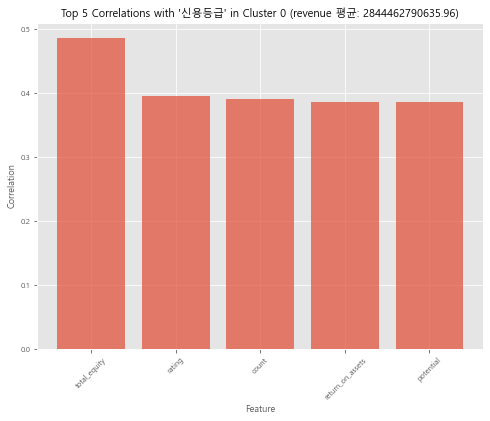

Cluster 1 (revenue 평균: 72800390617792.78)
Top 5 Correlations with '신용등급' in Cluster 1 (revenue 평균: 72800390617792.78):
                   Column  Correlation
0  non_current_debt_ratio     0.798162
1            fixed_assets     0.628854
2            total_equity     0.626034
3      inventory_turnover     0.613491
4                     ceo     0.600737



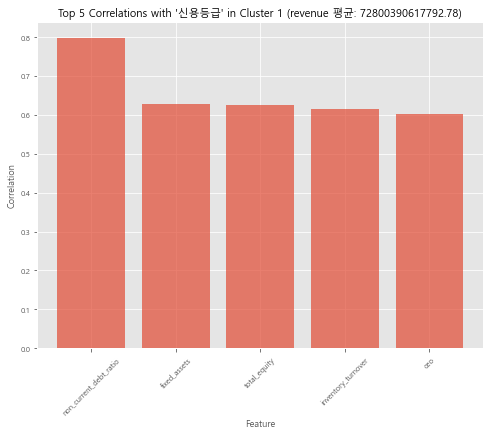

Cluster 2 (revenue 평균: 23791443518690.973)
Top 5 Correlations with '신용등급' in Cluster 2 (revenue 평균: 23791443518690.973):
                Column  Correlation
0                  ceo     0.454451
1     operating_income     0.431821
2            potential     0.427450
3            recommend     0.419646
4  gross_profit_margin     0.411987



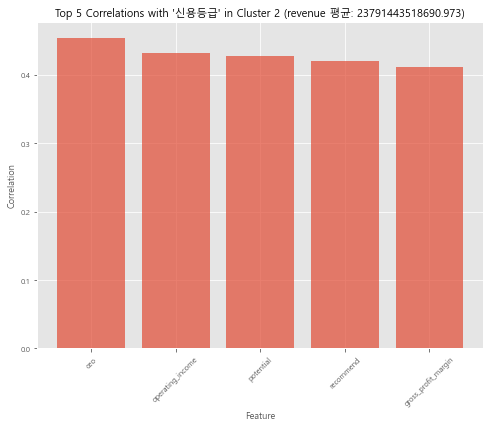

In [ ]:
from sklearn.cluster import KMeans

data_copy = data_with_rank.copy()

# 클러스터링을 위한 데이터 선택
cluster_data = data_copy[['revenue']]
data_copy['rank']=data_copy['rank'] = data_copy['rank'].astype(int)
# 클러스터링 수행
kmeans = KMeans(n_clusters=3, random_state=0)
cluster_labels = kmeans.fit_predict(cluster_data)

# 클러스터링 결과를 데이터프레임에 추가
data_copy['Cluster'] = cluster_labels

# 각 클러스터별로 그룹화
grouped_clusters = data_copy.groupby('Cluster')

# 클러스터별 revenue 평균 계산
avg_sales = data_copy.groupby('Cluster')['revenue'].mean()
cluster_names = ['하위', '중위', '상위']
avg_sales.index = cluster_names


# 각 클러스터별로 상관관계가 높은 피쳐 상위 5개를 시각화
for cluster, df_cluster in grouped_clusters:
    df_cluster = df_cluster.drop(['corp', 'revenue', 'Cluster'], axis=1)
    correlation = df_cluster.corr().abs()
    selected_corr = correlation['rank'].drop('rank')
    top_5 = selected_corr.sort_values(ascending=False).head(5)
    result_df = pd.DataFrame({'Column': top_5.index, 'Correlation': top_5.values})
    result_df.reset_index(drop=True, inplace=True)
    cluster_label = f"Cluster {cluster} (revenue 평균: {avg_sales[cluster]})"
    print(cluster_label)
    print(f"Top 5 Correlations with '신용등급' in {cluster_label}:")
    print(result_df)
    print()
    
    # 상위 5개의 피쳐에 대한 바 그래프 시각화
    plt.figure(figsize=(8, 6))
    plt.bar(result_df['Column'], result_df['Correlation'], alpha=0.7)
    plt.title(f"Top 5 Correlations with '신용등급' in {cluster_label}")
    plt.xlabel('Feature')
    plt.ylabel('Correlation')
    plt.xticks(rotation=45)
    plt.show()


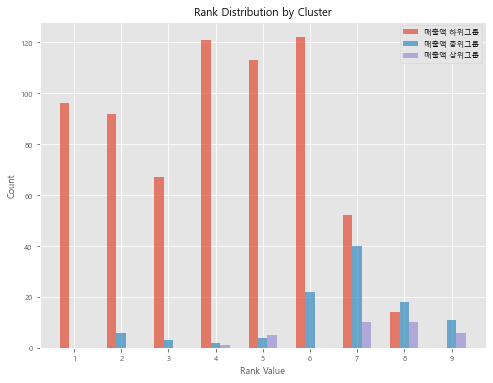

In [ ]:

plt.figure(figsize=(8, 6))

# rank 값에 따라 그룹별로 옆으로 이동하여 바 그래프를 그리기 위한 변수 설정
bar_width = 0.2
offsets = [-bar_width, 0, bar_width]

# 그룹명 설정
group_names = ['매출액 하위그룹', '매출액 중위그룹', '매출액 상위그룹']

# 그룹별로 rank 값에 따른 바 그래프를 옆으로 이동하여 그리기
for idx, cluster_id in enumerate(data_copy['Cluster'].unique()):
    cluster_data = data_copy[data_copy['Cluster'] == cluster_id]
    cluster_rank = cluster_data['rank'].value_counts().sort_index()
    plt.bar(cluster_rank.index + offsets[idx], cluster_rank.values, alpha=0.7, width=bar_width, label=group_names[idx])

# 폰트 경로 설정 (본인 환경에 맞게 경로를 수정해주세요)
font_path = 'C:\Windows\Fonts\malgun.ttf'

# 폰트 이름 얻기
font_name = font_manager.FontProperties(fname=font_path).get_name()

# 한글 폰트 설정
rc('font', family=font_name)
plt.title('Rank Distribution by Cluster')
plt.xlabel('Rank Value')
plt.ylabel('Count')

plt.xticks(range(1, max(data_copy['rank']) + 1))
plt.legend()
plt.show()


### 각 열에 대해 rank 값에 따른 분포를 boxplot으로 시각화

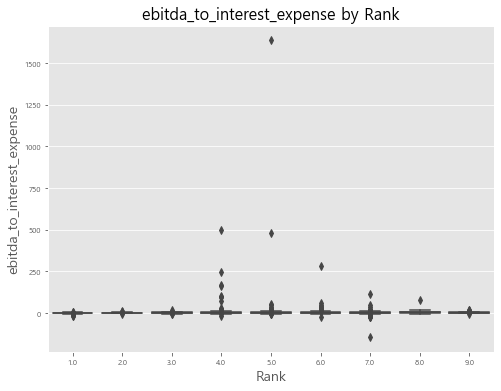

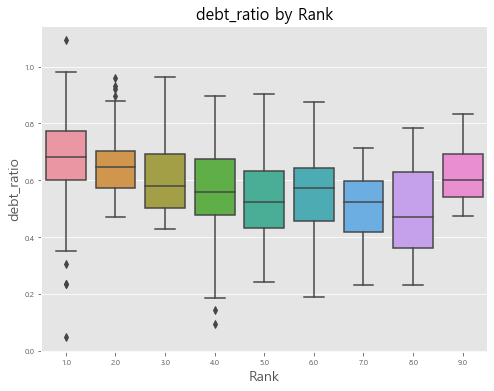

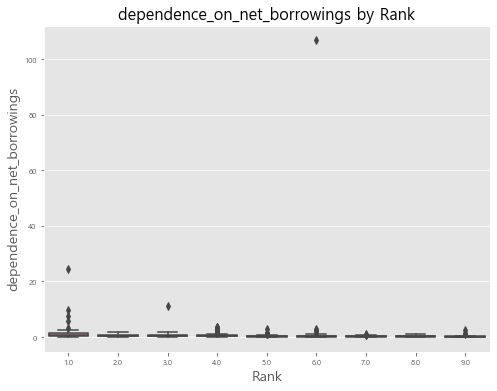

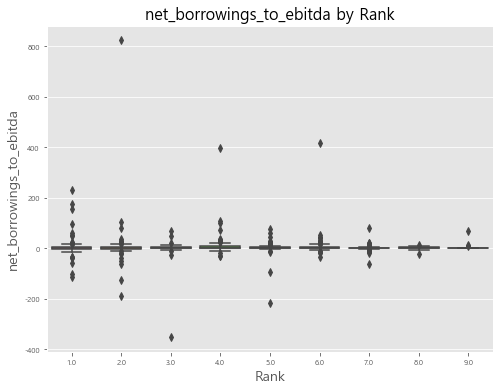

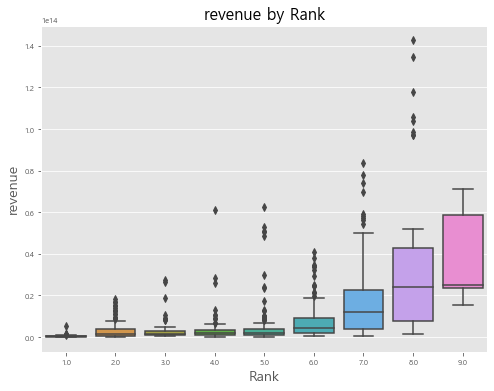

...

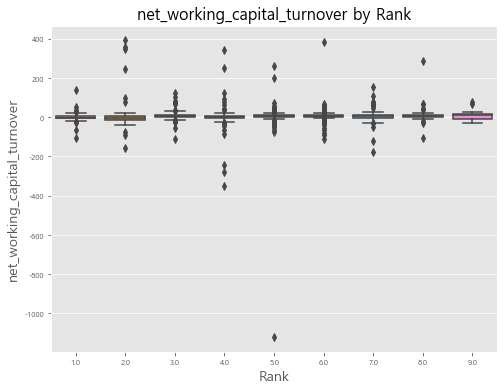

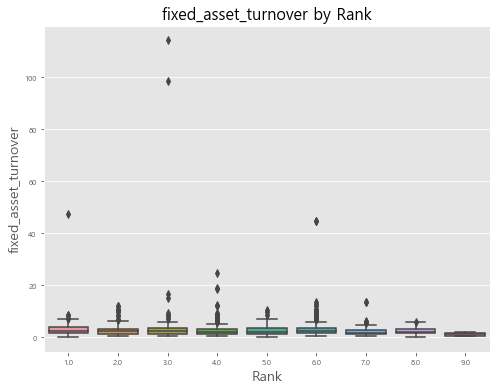

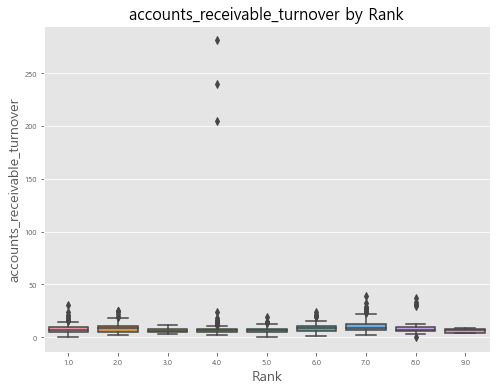

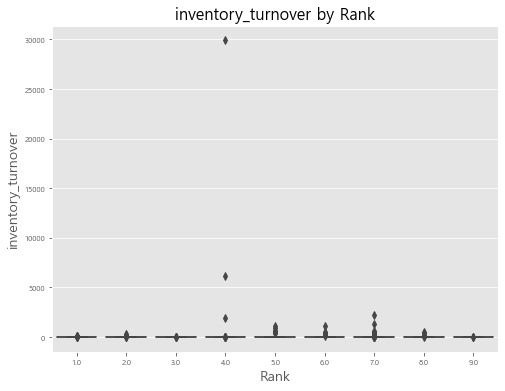

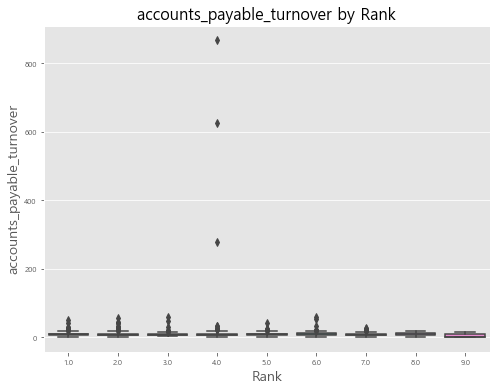

In [109]:
# rank에 따른 boxplot
# 데이터프레임에서 rank 열을 제외한 나머지 열들을 선택
columns_to_visualize = data_with_rank.columns[5:].drop('rank')

# 각 열에 대해 rank 값에 따른 분포를 boxplot으로 시각화
for column in columns_to_visualize:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='rank', y=column, data=data_with_rank)
    plt.title(f'{column} by Rank', fontsize=16)
    plt.xlabel('Rank', fontsize=14)
    plt.ylabel(column, fontsize=14)
    plt.show()

## 신용등급에 큰 영향을 미치는 변수는 무엇일까?

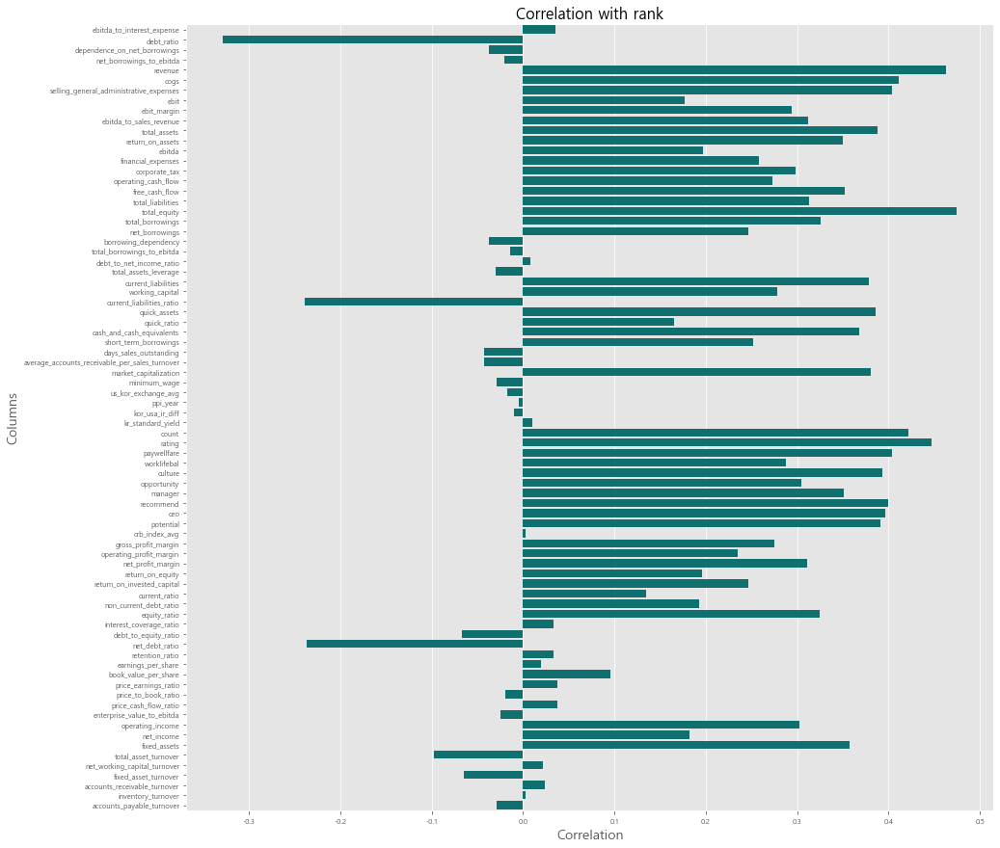

In [110]:
# rank 칼럼과 다른 칼럼들 간의 상관계수 계산
rank_correlation = data_with_rank.iloc[:, 5:].corrwith(data_with_rank['rank']).drop('rank')

# 상관계수를 시각화하여 가장 영향을 많이 주는 칼럼 파악
plt.figure(figsize=(15, 15))
sns.barplot(x=rank_correlation.values, y=rank_correlation.index, orient='h', color='Teal')
plt.title('Correlation with rank', fontsize=16)
plt.xlabel('Correlation', fontsize=14)
plt.ylabel('Columns', fontsize=14)
plt.show()

In [111]:
# 상관관계가 높은 상위 5개의 칼럼 추출
top_5_columns = rank_correlation.nlargest(5)
bot_5_columns = rank_correlation.nsmallest(5)

# 결과 출력
print("신용등급에 긍정적인 영향을 미치는 Top 5:")
for column, correlation in top_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")
    
print('')
print("신용등급에 부정적인 영향을 미치는 Top 5:")
for column, correlation in bot_5_columns.items():
    print(f"{column} {np.round(correlation, 2)}")

신용등급에 긍정적인 영향을 미치는 Top 5:
total_equity 0.47
revenue 0.46
rating 0.45
count 0.42
cogs 0.41

신용등급에 부정적인 영향을 미치는 Top 5:
debt_ratio -0.33
current_liabilities_ratio -0.24
net_debt_ratio -0.24
total_asset_turnover -0.1
debt_to_equity_ratio -0.07


양의 상관관계
<br>총자본, 매출, 직원기업평가 별점지수(rating)와 갯수, 매출원가가 신용등급과의 상관관계가 크다.

> 기업의 재무상태가 좋으며 매출이 높고 기업에 대한 직원평가가 좋을 수록 신용등급이 좋을 상관관계가 있음을 시사한다.
<br>

음의 상관관계
<br> 부채비율이 높고, 유동부채비율과 순부채비율이 높을수록 신용등급이 낮은 상관관계가 있었다.
<br> 또한 상관계수가 낮기는 하나 약하긴 하나 AAA 등급의 기업의 경우 총자산회전율이 다른 신용등급을 가진 기업들에 비해 낮은 경향을 보였으며, 총부채를 총자본으로 나눈 부채자본비율 역시 낮을수록 신용등급이 좋아지는 경향성이 보였다.
> 역시 직관적으로 알 수 있듯이 전체 자본과 자산대비 빚이 적은 기업일수록 신용등급이 높은 것을 알 수 있다.

### 신용등급별 양의 상관관계 지표 평균 비교

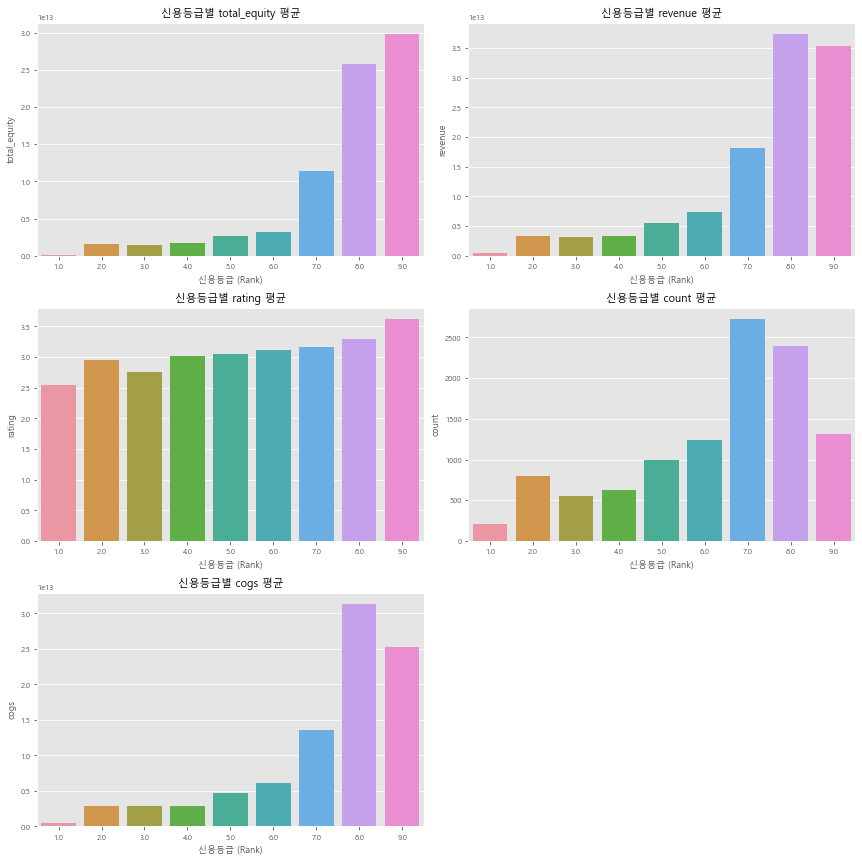

In [112]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 신용등급별 피쳐 값의 평균 계산
mean_features_by_rank = data_with_rank.groupby("rank")[top_5_columns.index].mean()


# 그래프 그리기
num_plots = len(top_5_columns)
num_rows = (num_plots // 2) + (num_plots % 2)

plt.figure(figsize=(12, 12))
for i, feature in enumerate(mean_features_by_rank.columns):
    plt.subplot(num_rows, 2, i+1)
    sns.barplot(x=mean_features_by_rank.index, y=mean_features_by_rank[feature])
    plt.xlabel("신용등급 (Rank)")
    plt.ylabel(feature)
    plt.title(f"신용등급별 {feature} 평균")
    plt.tight_layout()

plt.show()

### 신용등급별 음의 상관관계 지표 평균 비교

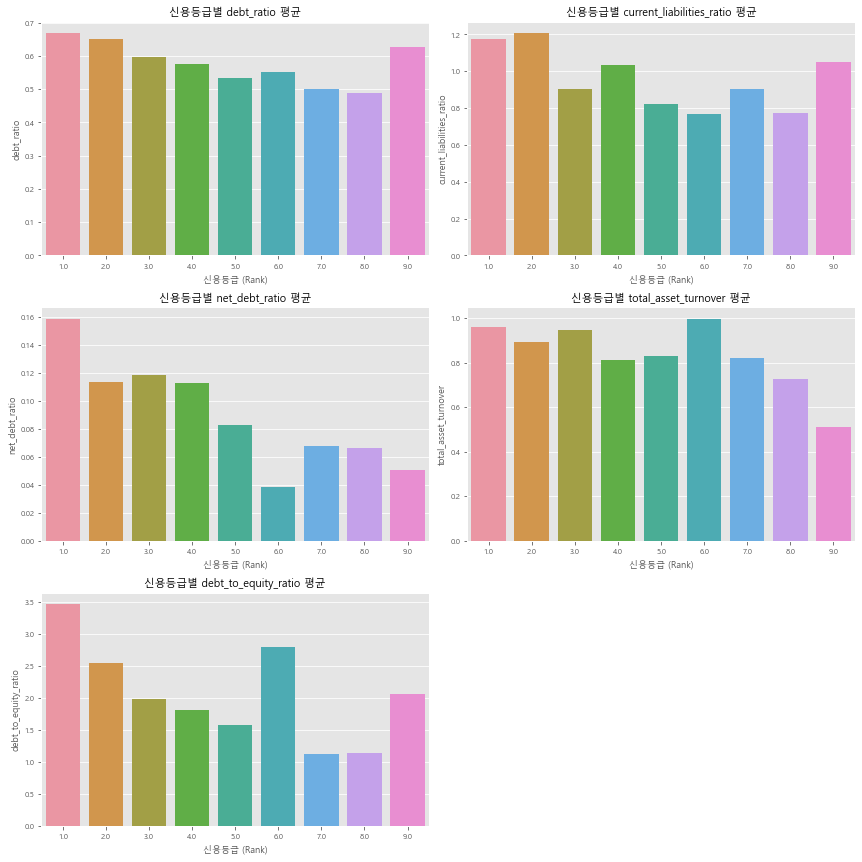

In [113]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 신용등급별 피쳐 값의 평균 계산
mean_features_by_rank = data_with_rank.groupby("rank")[bot_5_columns.index].mean()


# 그래프 그리기
num_plots = len(bot_5_columns)
num_rows = (num_plots // 2) + (num_plots % 2)

plt.figure(figsize=(12, 12))
for i, feature in enumerate(mean_features_by_rank.columns):
    plt.subplot(num_rows, 2, i+1)
    sns.barplot(x=mean_features_by_rank.index, y=mean_features_by_rank[feature])
    plt.xlabel("신용등급 (Rank)")
    plt.ylabel(feature)
    plt.title(f"신용등급별 {feature} 평균")
    plt.tight_layout()

plt.show()

## 산업별 지표

In [114]:
# 산업별 테이블 생성
industry_average_investment = model_b_processed.drop(['corp','stock_code','rank'], axis = 1).groupby(['sector', 'year']).mean()

In [115]:
# 산업별 연도 전부 평균

industry_average_investment_year = industry_average_investment.reset_index().drop(['year'],axis=1).groupby(['sector']).mean()
industry_average_investment_year.reset_index(inplace = True)

In [116]:
industry_average_investment_year

,sector,ebitda_margin,ebitda_to_interest_expense,debt_ratio,dependence_on_net_borrowings,net_borrowings_to_ebitda,revenue,cogs,selling_general_administrative_expenses,ebit,...,enterprise_value_to_ebitda,operating_income,net_income,fixed_assets,total_asset_turnover,net_working_capital_turnover,fixed_asset_turnover,accounts_receivable_turnover,inventory_turnover,accounts_payable_turnover
0,건설업,4.039839,68.035836,0.570260,0.353989,-0.035988,2.802632e+12,2.480365e+12,1.440248e+11,1.496960e+11,...,56.633510,1.845750e+11,1.123785e+11,3.443607e+11,0.951596,5.965768,17.425680,10.275581,103.204514,9.146460
1,광업,-57.195304,-2.408264,0.420190,0.478050,-1.440161,3.365605e+10,2.503869e+10,1.673835e+10,-1.677076e+10,...,-25.185414,-8.120985e+09,-1.853521e+10,2.932054e+10,0.246211,-5.841386,1.186861,4.349631,3.674274,6.623147
2,기계,-6.081058,3.335678,0.531205,0.425122,2.037142,1.181312e+12,9.912040e+11,1.257499e+11,2.488481e+10,...,17.853084,6.308501e+10,1.761420e+10,8.405278e+11,0.733592,6.660658,3.003067,6.101842,6.981639,8.219289
3,기타금융,7.182821,15.283075,0.446153,0.298556,3.048500,6.051815e+12,5.050134e+12,6.167714e+11,2.807682e+11,...,19.017620,3.896312e+11,2.332064e+11,3.104748e+12,0.717252,8.215232,3.557171,9.041586,21.538292,15.457995
4,기타제조업,6.646275,14.075578,0.449871,0.427604,-1.228330,8.694038e+11,5.442910e+11,1.906400e+11,1.410240e+11,...,-3.077318,1.344728e+11,9.989297e+10,3.104864e+11,1.068828,10.256607,4.135434,7.370073,4.854464,7.796528
5,"농업, 임업 및 어업",6.216918,29.859941,0.395633,0.317354,0.484820,4.026821e+11,3.541250e+11,3.131617e+10,2.626528e+10,...,3.940562,1.724093e+10,2.057988e+10,2.170346e+11,0.894052,-1.865536,4.270815,11.037762,5.813985,11.657105
6,비금속광물,4.758850,3.912806,0.414270,0.264714,1.971944,6.665496e+11,5.350649e+11,7.123556e+10,4.875313e+10,...,12.834175,5.591867e+10,4.256112e+10,6.206066e+11,0.720574,3.083903,1.743552,5.159310,7.251292,26.509072
7,서비스업,-2.472882,22.309595,0.465347,0.684129,1.189021,1.296167e+12,7.302327e+11,2.127407e+11,1.113438e+11,...,21.017876,5.805387e+11,1.169672e+11,6.153766e+11,0.756757,7.051964,5.605891,15.519362,406.744850,25.976636
8,섬유의복,-3.778028,7.410222,0.443236,0.510339,2.019615,6.590114e+11,4.353658e+11,1.857919e+11,2.984198e+10,...,33.170549,3.687923e+10,1.787707e+10,1.538319e+11,0.927152,7.027413,5.081590,11.051896,3.048231,11.285605
9,운수장비,0.056499,5.896647,0.566610,0.619965,5.621881,6.217933e+12,5.320576e+12,5.692185e+11,2.269989e+11,...,24.703533,2.130054e+11,1.558059e+11,2.223735e+12,0.972294,0.413264,2.681511,8.931962,9.486626,6.463063


## [투자지표] 산업별로 확인해보기
---

|수익성 (Profitability)|안정성 (Stability)|활동성 (Activity)|가치지표 (Valuation)|
|---|---|---|---|
|매출총이익률 (Gross Profit Margin)|부채비율 (Debt Ratio)|총자산회전율 (Total Asset Turnover Ratio)|EPS (Earnings Per Share)|
|영업이익률 (Operating Profit Margin)|유동비율 (Current Ratio)|자기자본회전율 (Return on Equity)|BPS (Book Value Per Share)|
|순이익률 (Net Profit Margin)|당좌비율 (Quick Ratio)|순운전자본회전율 (Net Working Capital Turnover Ratio)|PER (Price-Earnings Ratio)|
|EBITDA마진율 (EBITDA Margin)|비유동부채비율 (Non-Current Debt Ratio)|유형자산회전율 (Fixed Asset Turnover Ratio)|PBR (Price-to-Book Ratio)|
|ROE (Return on Equity)|자기자본비율 (Equity Ratio)|매출채권회전율 (Accounts Receivable Turnover Ratio)|PCR (Price-Cash Flow Ratio)|
|ROA (Return on Assets)|이자보상배율 (Interest Coverage Ratio)|재고자산회전율 (Inventory Turnover Ratio)|EV/EBITDA (Enterprise Value to EBITDA)|
|ROIC (Return on Invested Capital)|차입금비율 (Debt-to-Equity Ratio)|매입채무회전율 (Accounts Payable Turnover Ratio)||
||순부채비율 (Net Debt Ratio)|||
||자본유보율 (Retention Ratio)|||

---
> 대체적으로,
> - `수익성지표`에서는 통신업, 서비스업, 의료정밀 산업이 높은 평가를 받고 있다. 광업은 전반적인 수익성 지표에서 현저히 낮은 평가를 나타냄을 확인 할 수 있다.
> - `안정성지표`에서는 대체적으로 평이하나 주요지표에서 운수창고업, 전기가스업 1,2등을 위치하고 있다.
> - `활동성지표`에서는 산업군의 특징에 따라 지표별로 고르게 분포하고 있다.
> - `가치지표`에서는 EPS같은 지표에서는 건설업, 철강금속 압도적이며, 의료정밀 같은 경우 PBR 에서 압도적이지만 다른 가치지표에서 최하위에 위치하고 있다.

In [117]:
def plot_indicators(data, indicator_name, colors):
    plt.figure(figsize=(15, 6 * len(data)))
    
    for i, column in enumerate(data):
        ax = plt.subplot(len(data), 1, i+1)
        column_values = industry_average_investment_year[column]
    
        color = random.choice(colors)
        
        ax.bar(industry_average_investment_year['sector'], column_values, color=color)
        ax.set_title(column, fontsize=20)
        ax.set_xlabel('Sector')
        ax.set_ylabel(column)
        ax.tick_params(axis='x', labelrotation=45, labelsize=16)
    
    plt.suptitle(f'{indicator_name} Indicators', fontsize=30, y=1.001)
    plt.tight_layout()
    plt.show()

colors = ['#FF6F61', '#6B5B95', '#88B04B', '#955251', '#B565A7', '#009B77', '#F6A600']


profitability = ['gross_profit_margin', 'operating_profit_margin', 'net_profit_margin',
                 'ebitda_margin', 'return_on_equity', 'return_on_assets', 'return_on_invested_capital']
        
stability = ['debt_ratio', 'current_ratio', 'quick_ratio', 'non_current_debt_ratio', 'equity_ratio', 'interest_coverage_ratio', 
             'debt_to_equity_ratio', 'net_debt_ratio', 'retention_ratio']

activity = ['total_asset_turnover', 'return_on_equity', 'net_working_capital_turnover',
            'fixed_asset_turnover', 'accounts_receivable_turnover', 'inventory_turnover',
            'accounts_payable_turnover']

valuation = ['earnings_per_share', 'book_value_per_share', 'price_earnings_ratio',
             'price_to_book_ratio', 'price_cash_flow_ratio', 'enterprise_value_to_ebitda']

rating = ['rating', 'count', 'paywellfare', 'worklifebal', 'culture', 'opportunity', 'manager',
       'recommend', 'ceo', 'potential']

summary = ['ebitda_margin','ebitda_to_interest_expense', 'debt_ratio',
       'dependence_on_net_borrowings', 'net_borrowings_to_ebitda']

operating_profitability = ['revenue', 'cogs', 'selling_general_administrative_expenses', 'ebit',
       'ebit_margin', 'ebitda_to_sales_revenue','total_assets','return_on_assets']

cash_flow_trends = ['ebitda', 'financial_expenses', 'corporate_tax',
       'operating_cash_flow', 'free_cash_flow']

financial_stability = ['total_liabilities',
       'total_equity', 'total_borrowings', 'net_borrowings',
       'borrowing_dependency', 'total_borrowings_to_ebitda',
       'debt_to_net_income_ratio', 'total_assets_leverage',
       'current_liabilities', 'working_capital', 'current_liabilities_ratio',
       'quick_assets', 'quick_ratio']

liquidity = ['cash_and_cash_equivalents',
       'short_term_borrowings', 'days_sales_outstanding',
       'average_accounts_receivable_per_sales_turnover']

## 수익성 지표
---
- `매출총이익률`: 통신업이 압도적 1등
- `영업이익률`: 통신업과 서비스업이 압도적 1,2등
- `순이익률`: 기타금용, 의료정밀 1,2등
- `EBITDA마진율`: 의료정밀 1등
- `ROE`: 건설업 1등
- `ROA`: 의료정밀 1등
- `ROIC`: 통신업과 서비스업이 압도적 1,2등

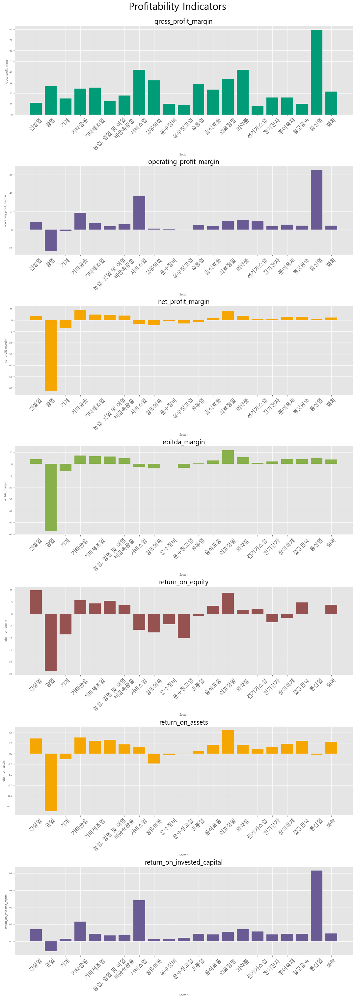

In [118]:
plot_indicators(profitability, 'Profitability', colors)

## 안정성 지표
---
- `부채비율` : 대체적으로 평이함, 운수창고업, 전기가스업 1,2등
- `유동비율` : 의료정밀, 의약품, 전기전자 1등
- `당좌비율` : 의약품, 서비스업 1등
- `비유동부채비율` : 운수창고업, 전기가스업 1,2등
- `자기자본비율` : 의료정밀 1등
- `이자보상배율` : 의료정밀 독보적 1등
- `차입금비율` : 운수창고업, 종이목재 1,2등
- `순부채비율` : 종이목재 1등
- `자본유보율` : 철강금속 1등


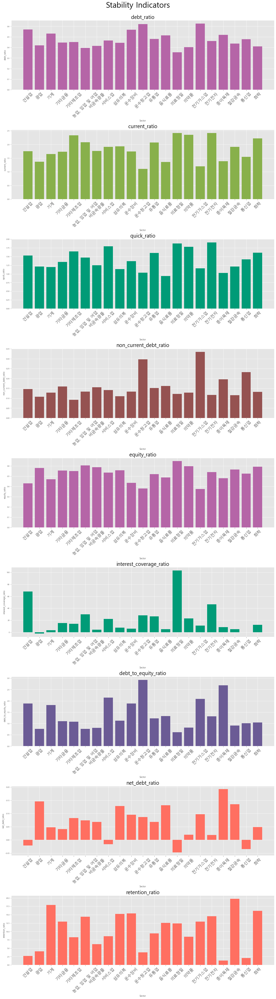

In [119]:
plot_indicators(stability, 'Stability', colors)

## 활동성 지표
---

- `총자산회전율` : 대체적으로 평이. 음식료품, 유통업 1등 광업 꼴등
- `자기자본회전율` : 광업 꼴등
- `순운전자본회전율` : 통신업, 전기전자 1,2등
- `유형자산회전율` : 건설업 압도적 1등
- `매출채권회전율` : 종이목재 1등
- `재고자산회전율` : 운수창고업 1등
- `매입채무회전율` : 유통업 압도적 1등

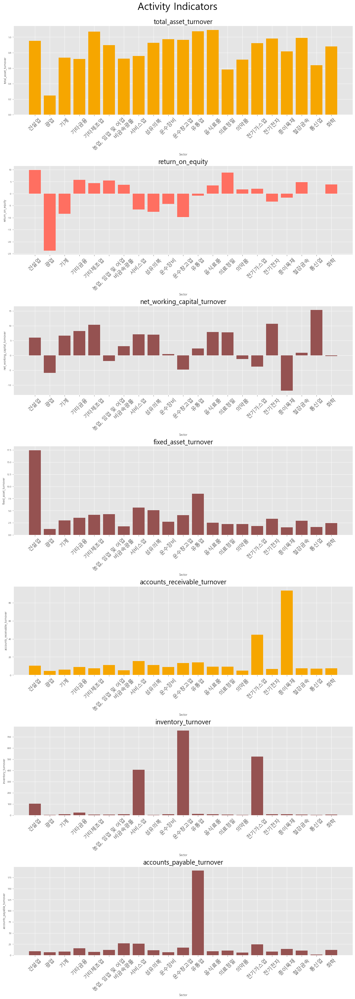

In [120]:
plot_indicators(activity, 'Activity', colors)

## 가치 지표
---
- 'EPS' : 건설업, 철강금속 압도적 1등
- 'BPS' : 철강금속 압도적 1등
- 'PER' : 건설업, 의약품 1등, 의료정밀 꼴등
- 'PBR' : 의료정밀 1등
- 'PCR' : 농의료정밀 압도적 꼴등
- 'EV/EBITDA' : 의료정밀 꼴등

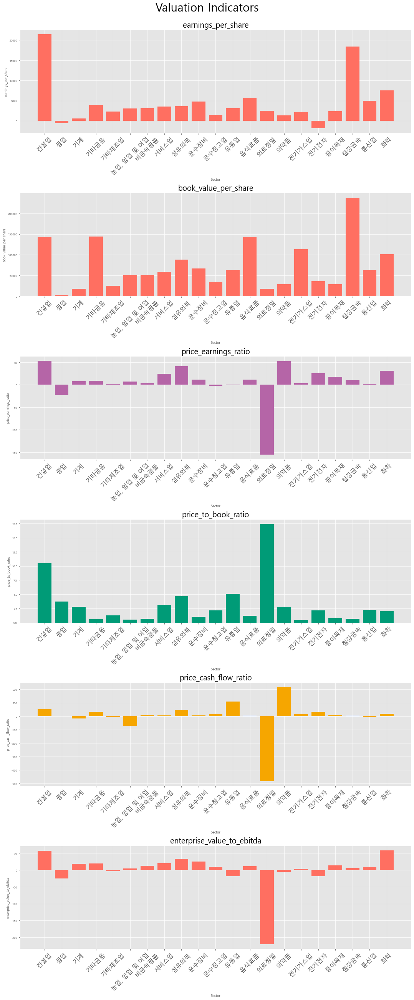

In [121]:
plot_indicators(valuation, 'Valuation', colors)

## 산업별로 평점(별점) 어떻게 차이가 날까?
---
| 별점 (rating)             |
|----------------------------------|
| 총 별점 (rating) |
| 별점 총 수 (count)  |
| 임금 및 복지 (paywellfare)       |
| 업무와 삶의 균형 (worklifebal)      |
| 사내 문화 (culture)            |
| 승진 가능성 및 기회 (opportunity)          |
| 경연진 평 (manager) |
| 기업 추천도 (recommend) |
| CED 지지율 (ceo) |
| 성장 잠재성 (potential) |       

---
> 큰 차이는 확인 할 수 없으나. 기타제조업, 농업,임업 및 어업 두 산업이 대체적으로 낮은 평가를 받고 있는 것을 확인 할 수 있다.


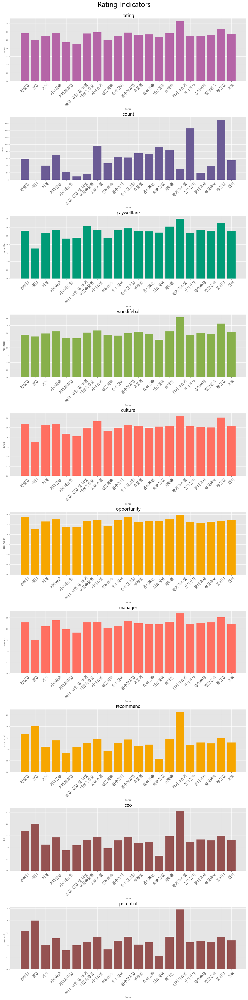

In [122]:
plot_indicators(rating, 'Rating', colors)

## [신용지표] 산업별로 확인해보기
---
| 요약 (Summary) | 영업성과 (Operating Profitability) | 현금흐름 동향 (Cash Flow Trends) | 재무 안정성 (Financial Stability) | 유동성 (Liquidity) |
| ------------------------ | ------------------------------ | -------------------------- | ----------------------------- | ---------------- |
| EBITDA 마진율 (ebitda_margin) | 매출액 (revenue) | EBITDA (ebitda) | 총부채 (total_liabilities) | 현금 및 현금성 자산 (cash_and_cash_equivalents) |
| EBITDA 대 이자비용 (ebitda_to_interest_expense) | 상품 판매 비용 (cogs) | 재무 비용 (financial_expenses) | 총자본 (total_equity) | 단기차입금 (short_term_borrowings) |
| 부채비율 (debt_ratio) | 판매 및 경영 비용 (selling_general_administrative_expenses) | 법인세 (corporate_tax) | 총차입금 (total_borrowings) | 매출채권 회전일수 (days_sales_outstanding) |
| 순차입금 의존도 (dependence_on_net_borrowings) | 영업이익 (ebit) | 영업활동으로 인한 현금흐름 (operating_cash_flow) | 순차입금 (net_borrowings) | 매출채권 평균 회전기간 (average_accounts_receivable_per_sales_turnover) |
| 순차입금 대 EBITDA (net_borrowings_to_ebitda) | 영업이익률 (ebit_margin) | 잉여현금흐름 (free_cash_flow) | 차입금 의존도 (borrowing_dependency) | |
| | EBITDA 대 매출액 (ebitda_to_sales_revenue) | | 총차입금 대 EBITDA (total_borrowings_to_ebitda) | |
| | 총자산 (total_assets) | | 순이익 대 부채 비율 (debt_to_net_income_ratio) | |
| | 자산수익률 (return_on_assets) | | 총자산 레버리지 (total_assets_leverage) | |
| | | | 유동부채 (current_liabilities) | |
| | | | 운전자본 (working_capital) | |
| | | | 유동부채비율 (current_liabilities_ratio) | |
| | | | 당좌자산 (quick_assets) | |
| | | | 당좌비율 (quick_ratio) | |

---
> 종합적으로
> - 

신용등급을 평가하는데 활용하는 주요지표 중
> - `ebitda마진`의 경우 광업이 다른 산업에 비해 월등히 낮음, 의료정밀 산업의 경우 다른 산업에 비해 상대적으로 ebitda마진율이 높은 것으로 나타남.
> - `ebitda/이자비용`의 경우 건설, 의료정밀, 전기전자업에서 상대적으로 높음.
> - `순차입의존도`는 종이목재업에서 가장 높음.
> - `순차입금/ebitda` 전기가스업에서 압도적으로 높게 나와 순차입금이 많고 그에 반해 순수한 영업이익(ebidtda)은 것으로 파악됨.

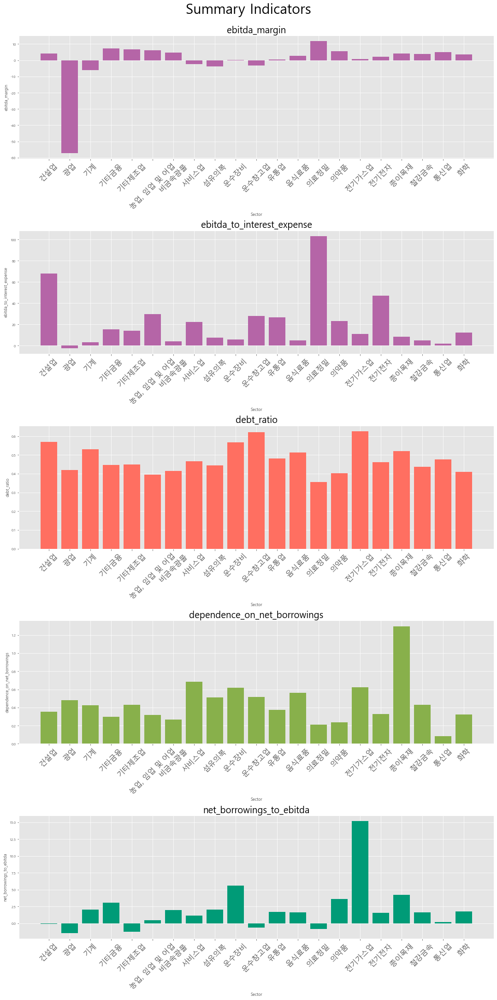

In [123]:
plot_indicators(summary, 'Summary', colors)

### 영업수익성 지표
> 업종별로 영업수익성을 나타내는 지표들을 확인한 결과 매출의 규모로 봤을 때 통신업과 전기가스업, 전기전자 업종이 우세한 것으로 드러남. 
> <br> 전기가스업의 경우 매출액은 높으나 매출원가가 높아서 ebit에서 유일하게 마이너스 값을 기록.
> <br>총 자산의 경우 전기가스업과 통신업, 전기전자업종들이 업종 특성상 설비투자의 규모가 커서 가장 높게 나옴. 
> <br>ROA의 경우 의료정밀 업이 가장 높게 나왔고, 광업의 경우 타 산업과 비교도 되지 않을 정도로 마이너스값이 높게 나옴 


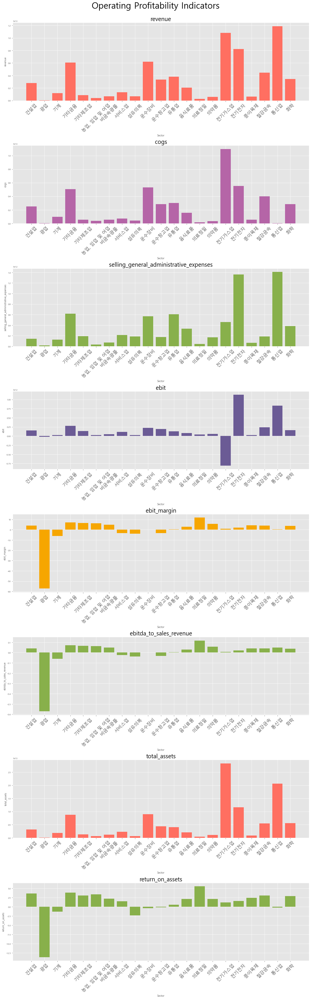

In [124]:
plot_indicators(operating_profitability, 'Operating Profitability', colors)

### 현금흐름지표

> 법인세와 이자비용, 감가상각을 제외한 순수이익을 나타내는 ebitda의 경우 국내에서 큰 산업에 속하는 통신업과 전기가스업이 가장 높게 나옴.
> <br> 운영현금, 자유현금흐름에서도 통신업과 전기전자업에서 가용가능한 현금흐름이 큰 것으로 드러남.
> <br> 금융비용의 경우 전기가스업, 전기전자, 금융업에서 높았음.

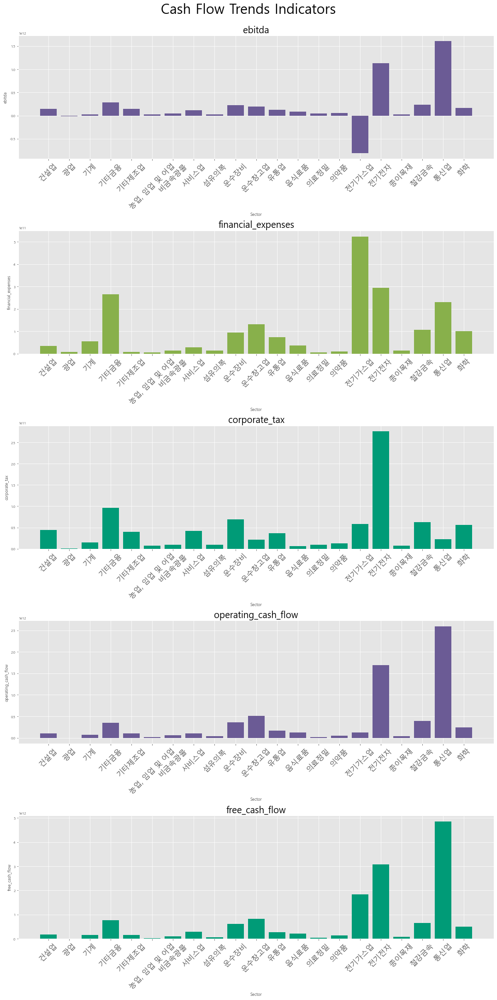

In [125]:
plot_indicators(cash_flow_trends, 'Cash Flow Trends', colors)

### 재무 안전성

> 재무 안정성 지표들을 확인한 결과
<br> 대체적으로 돈을 많이 버는 통신업, 전기전자업의 경우 총 자본, 차입금 등이 매출과 비례하여 높았고,
<br> 특이한 사항으로 전기가스업이 부채, 총차입금, 순차입금의 경우 전기가스업이 가장 높은 경향을 보임. 총차입금/ebitda또한 높게 나와 차입금은 큰 것에 비해 수익이 별로 나오지 않는 현상으로 보임.
<br> 또한 차입금의 경우 업의 본질이 대출을 기반으로한 금융업이 높게 나옴

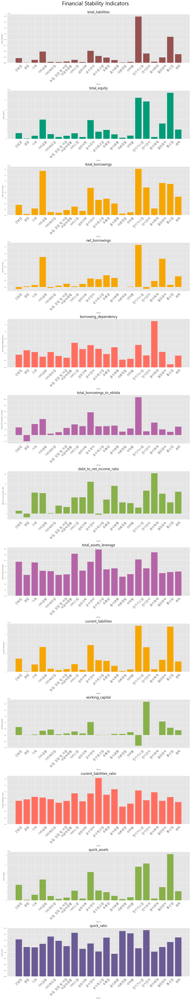

In [126]:
plot_indicators(financial_stability, 'Financial Stability', colors)

### 유동성지표

현금성 자산 역시 수익을 많이 발생시키는 전기전자, 통신업이 많은 것으로 파악
<br> 단기차입금 전기가스업이 가장 많은 것으로 나왔다.
<br> 광업의 경우 매출채권회수일수가 가장 높게 나왔고 나머지 업계는 대동소이.


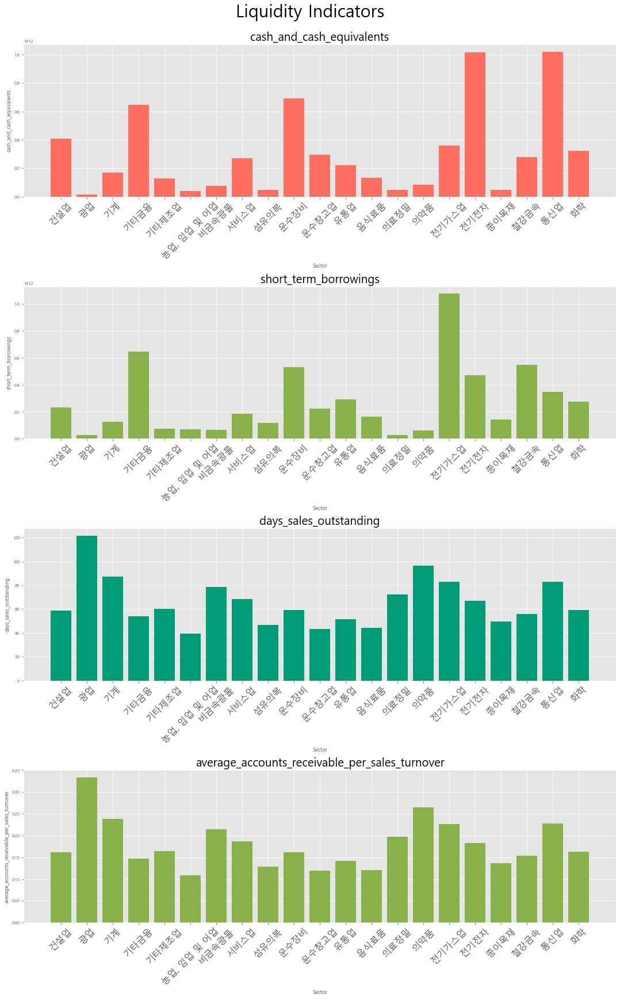

In [127]:
plot_indicators(liquidity, 'Liquidity', colors)

In [128]:
data_with_rank['rank']

1       2.0
2       2.0
3       2.0
4       2.0
25      6.0
       ... 
2996    3.0
2997    3.0
3004    1.0
3005    1.0
3006    1.0
Name: rank, Length: 815, dtype: float64

In [129]:
data_with_rank['sector'].unique()

array(['서비스업', '기타금융', '운수창고업', '음식료품', '화학', '건설업', '전기전자', '유통업', '기계',
       '운수장비', '섬유의복', '통신업', '전기가스업', '의약품', '철강금속', '종이목재',
       '농업, 임업 및 어업', '비금속광물', '기타제조업'], dtype=object)

In [130]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# market_capitalization을 3등분으로 그룹화하여 'Market_Cap_Group' 컬럼 생성
data_with_rank['market_cap'] = pd.qcut(data_with_rank['market_capitalization'], q=3, labels=['하위', '중위', '상위'])

# 각 그룹별로 데이터프레임 분할
grouped_data_group = data_with_rank.groupby('market_cap')

for group, df_group in grouped_data_group:
    df_group = df_group.drop(['market_capitalization'], axis=1)
    correlation = df_group.corr().abs()
    selected_corr = correlation['rank']
    selected_corr.drop('rank', inplace=True)
    top_10 = selected_corr.sort_values(ascending=False).head(10)
    
    result_df = pd.DataFrame({'Column': top_10.index, 'Correlation': top_10.values})
    result_df.reset_index(drop=True, inplace=True)
    
    print(f"Top 10 Correlations with '신용등급' in {group} market_capitalization 그룹:")
    print(result_df)
    print()


Top 10 Correlations with '신용등급' in 하위 market_capitalization 그룹:
                                    Column  Correlation
0                             total_equity     0.628636
1                             total_assets     0.600804
2                             fixed_assets     0.596409
3                             quick_assets     0.544736
4                                  revenue     0.544641
5  selling_general_administrative_expenses     0.522996
6                        total_liabilities     0.518584
7                            corporate_tax     0.455811
8                                     cogs     0.454314
9                                potential     0.421819

Top 10 Correlations with '신용등급' in 중위 market_capitalization 그룹:
                      Column  Correlation
0                quick_ratio     0.327737
1  current_liabilities_ratio     0.315951
2              current_ratio     0.303077
3            working_capital     0.300298
4                 debt_ratio     0.299819
5  

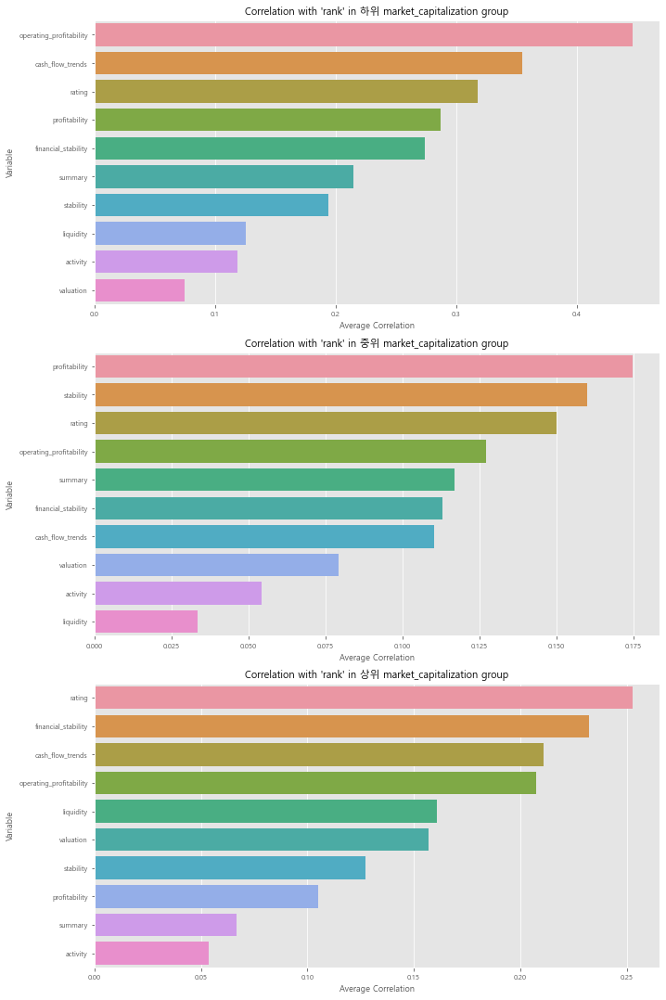

In [131]:
# Calculate average correlations for the given variables
variables = {
    'profitability': profitability,
    'stability': stability,
    'activity': activity,
    'valuation': valuation,
    'rating': rating,
    'summary': summary,
    'operating_profitability': operating_profitability,
    'cash_flow_trends': cash_flow_trends,
    'financial_stability': financial_stability,
    'liquidity': liquidity
}

# market_capitalization을 3등분으로 그룹화하여 'Market_Cap_Group' 컬럼 생성
data_with_rank['market_cap'] = pd.qcut(data_with_rank['market_capitalization'], q=3, labels=['하위', '중위', '상위'])

# 각 그룹별로 데이터프레임 분할
grouped_data_group = data_with_rank.groupby('market_cap')

# DataFrame을 저장하고 시각화
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

for idx, (group, df_group) in enumerate(grouped_data_group):
    df_group = df_group.drop(['market_capitalization'], axis=1)
    correlation = df_group.corr().abs()
    selected_corr = correlation['rank']
    selected_corr.drop('rank', inplace=True)
    corr_results = []
    
    for var_name, var_list in variables.items():
        var_corr = selected_corr.loc[var_list]
        avg_corr = var_corr.mean()
        corr_results.append((var_name, avg_corr))
    
    df_results = pd.DataFrame(corr_results, columns=['Variable', 'Avg Correlation'])
    df_results.sort_values('Avg Correlation', ascending=False, inplace=True)
    
    ax = axes[idx]
    sns.barplot(x='Avg Correlation', y='Variable', data=df_results, ax=ax)
    ax.set_xlabel('Average Correlation')
    ax.set_ylabel('Variable')
    ax.set_title(f"Correlation with 'rank' in {group} market_capitalization group")

plt.tight_layout()
plt.show()


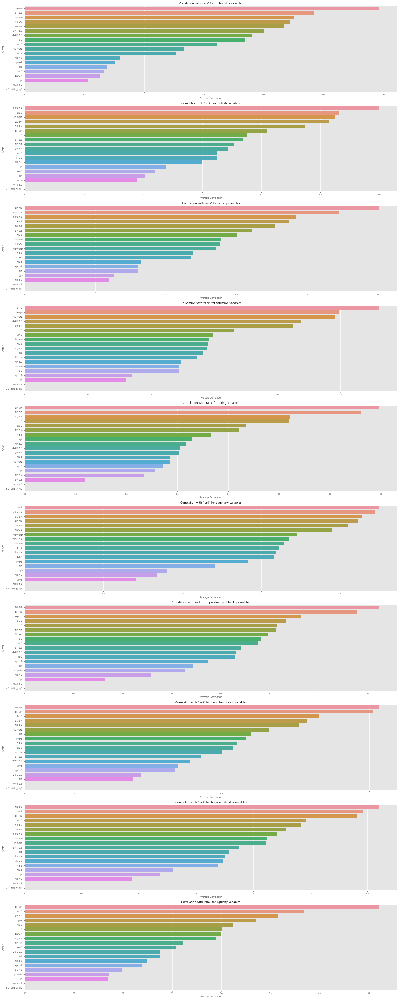

In [132]:

# 각 sector 별로 데이터프레임 분할
grouped_data_sector = data_with_rank.groupby('sector')

# DataFrame을 저장하고 시각화
fig, axes = plt.subplots(nrows=len(variables), ncols=1, figsize=(20, 50))

for idx, (var_name, var_list) in enumerate(variables.items()):
    corr_results = []
    
    for sector, df_sector in grouped_data_sector:
        df_sector = df_sector.drop(['sector'], axis=1)
        correlation = df_sector.corr().abs()
        selected_corr = correlation['rank']
        selected_corr.drop('rank', inplace=True)
        
        var_corr = selected_corr.loc[var_list]
        avg_corr = var_corr.mean()
        
        corr_results.append((sector, avg_corr))
    
    df_results = pd.DataFrame(corr_results, columns=['Sector', 'Avg Correlation'])
    df_results.sort_values('Avg Correlation', ascending=False, inplace=True)
    
    ax = axes[idx]
    sns.barplot(x='Avg Correlation', y='Sector', data=df_results, ax=ax)
    ax.set_xlabel('Average Correlation')
    ax.set_ylabel('Sector')
    ax.set_title(f"Correlation with 'rank' for {var_name} variables")

plt.tight_layout()
plt.show()
